In [1]:
import census_utils
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets, tree, metrics, model_selection, ensemble
from sklearn.externals.six import StringIO 
import matplotlib.colors as colors
from IPython.display import Image
from mpl_toolkits.mplot3d import Axes3D
import itertools
import dt_utils
import pydotplus
import seaborn as sns

# Data Exploration and Extraction

In [2]:
# ensure descriptions are not truncated 
pd.set_option('display.max_colwidth', -1)
pd.options.display.max_rows = 999
lookup = pd.read_pickle('../lookup/lookuptable.pkl')

Sorting the data by Table Code and Table Description to more easily find targetable features and then further refine by adding keywords and rejecting columns with Table Codes that won't load in the module.

In [3]:
lookup.groupby(['TableCode', 'TableDescription']).nunique()

,,TableCode,TableDescription,CatCode,CatDescription
TableCode,TableDescription,,,,
DC1101SC,Marital and civil partnership status by sex by age - Household Reference Persons (HRPs),1,1,105,105
DC1102SC,Living arrangements by sex by age - Household Reference Persons (HRPs),1,1,240,240
DC1104SC,Residence type by sex by age,1,1,216,216
DC1106SC,Schoolchildren and full-time students living away from home during term time by sex by age,1,1,21,21
DC1107SC,Marital and civil partnership status by sex by age,1,1,357,357
DC1108SC,Living arrangements by sex by age,1,1,510,510
DC1109SC,Household composition by sex by age,1,1,414,414
DC1110SC,Family composition by age of Family Reference Person (FRP),1,1,104,104
DC1112SC,Dependent children by household type by sex by age,1,1,135,135


Below drops any TableCodes containing DC as they don't seem to load properly or work correctly, similarly with the dz suffix

In [4]:
lookup[(~lookup.TableCode.str.contains("DC")) & (lookup.TableDescription.str.contains("unpaid care by "))].groupby(['TableCode', 'TableDescription']).nunique()

,,TableCode,TableDescription,CatCode,CatDescription
TableCode,TableDescription,,,,
LC2301SC,Ethnic group by provision of unpaid care by general health,1,1,168,168
LC3103SCdz,Provision of unpaid care by age,1,1,42,42
LC3105SC,Provision of unpaid care by dependent children in family by family status,1,1,175,175
LC3301SC,Provision of unpaid care by general health by age,1,1,120,120
LC6301SC,Economic activity by provision of unpaid care by general health,1,1,220,220


Replace TableCode with whatever interesting feature

In [5]:
lookup[lookup.TableCode == 'TableCode']

,TableCode,TableDescription,CatCode,CatDescription
UniqueCatCode,,,,


#  Interpretation and Visualisation

FEATURES

LC6601SC0010 - All people aged 16 to 74 in employment_Self-employed: With employees: Full-time  
LC4427SC0003 - Accommodation type by tenure - Households" / "All households_Owned: Owned outright  
LC6401SC0003 - All people aged 16 and over in households_Living in a couple: Married or in a registered same-sex civil partnership  
LC6210SC0023 - Economically active: Self-employed: Full-time (1)_Born in the UK  
LC7402SC0017 - 5km to less than 10km_All people aged 16 to 74 in households in employment

In [6]:
requested = {'LC6601SC' : ['0010'],
             'LC4427SC' : ['0003'],
             'LC6401SC' : ['0003'],
             'LC6210SC' : ['0023'],
             'LC7402SC' : ['0007']
            }

NORMALISED BY:

LC6601SC - All people aged 16 to 74 in employment_Self-employed: With employees: Total   
LC4427SC - All households  
LC6401SC - All people aged 16 and over in households_Living in a couple: Total  
LC6210SC - Economically active: Self-employed: Full-time (1)_All people aged 16 and over  
LC7402SC - any travel up to 10km_All people aged 16 to 74 in households in employment  

In [7]:
norm = {'LC6601SC' : { '0010':'0002' },
        'LC4427SC' : { '0003':'0001' },
        'LC6401SC' : { '0003':'0002' },
        'LC6210SC' : { '0023':'0001' },
        'LC7402SC' : { '0007':'0003' }
       }

In [8]:
features = census_utils.extractdata(requested , norm )

In [9]:
features.head()

,LC6601SC0010,LC4427SC0003,LC6401SC0003,LC6210SC0023,LC7402SC0007
ONSCode,,,,,
S29000001,0.013718,0.148478,0.538674,0.035748,0.073630
S29000002,0.026764,0.246404,0.666106,0.046242,0.066986
S29000003,0.018645,0.251430,0.762925,0.028802,0.079437
S29000004,0.012048,0.096805,0.422078,0.029988,0.057789
S29000005,0.018541,0.128045,0.501345,0.042130,0.057050


In [10]:
features.shape

(1012, 5)

In [11]:
copts = { "fill_color" : "YlGn", "legend_name" : "All people aged 16 and over in households_Living in a couple: Married or in a registered same-sex civil partnership"}
census_utils.genchoropleth(features, 'LC6401SC0003', copts_custom=copts)

Married couples (in same-sex or heterosexual relationships) tend to live further away from the city. Zooming in on the towns and city centres shows much less people living in the centre are living as a couple. This could be due to the proximity to universities and airports for Students, single Professionals etc and so they prefer to live closer to town.

In [12]:
copts = { "fill_color" : "YlGn", "legend_name" : " All people aged 16 to 74 in employment_Self-employed: With employees: Full-time"}
census_utils.genchoropleth(features, 'LC6601SC0010', copts_custom=copts)

Similarly, self employed people with full-time employees seem to be few and far between. However, there does appear to be a slight pattern where they live further outside the city and town centres. I have noticed that where these people are more abundant, there is usually an A or B road or train tracks or similar close by. 

In [13]:
copts = { "fill_color" : "YlGn", "legend_name" : "Accommodation type by tenure - Households / All households_Owned: Owned outright"}
mopts = { "location" : [55.95, -3.19], "zoom_start" : 11}
census_utils.genchoropleth(features, 'LC4427SC0003', mopts_custom=mopts, copts_custom=copts)

Similar to couples living together the closer you get to the centre of Glasgow/Aberdeen. The less households are actually owned by the occupants. Interestingly, Edinburgh appears to show no such pattern with a seemingly random variation on house ownership.

In [41]:
# single feature classification 
singlefeature = 'LC4427SC0003'
singlenorm = 'LC4427SC0001' 
tiers = [0.2 , 0.8]
outcome = census_utils.genclfsingle(singlefeature, tiers, singlenorm)

/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3697: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


In [15]:
outcome.head()

,Class
ONSCode,
S29000001,1
S29000002,2
S29000003,2
S29000004,1
S29000005,1


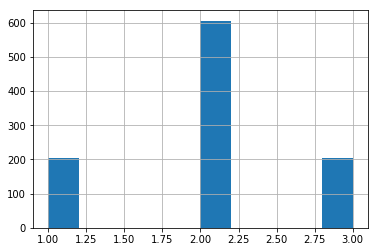

In [16]:
outcome.Class.hist()
plt.show()

Looking into the amount of unpaid care provided in all areas of Scotland. I will then look into what ethnicity provides the most unpaid care and what age range. The sex feature won't work as the census.utils won't load the data.

In [17]:
# multi-feature classifier 
requested = { 'LC3301SC': ['0005', '0010', '0014', '0018', '0022'] }
weights = { 'LC3301SC0005' : 1, 
           'LC3301SC0010' : 2,
           'LC3301SC0014' : 3,
           'LC3301SC0018' : 4,
          'LC3301SC0022' : 5}
tiers = [0.2, 0.8]
outcome = census_utils.genclfscore(requested, weights, tiers)

In [18]:
outcome.head()

,Score,Class
ONSCode,,
S29000001,1.055359,1
S29000002,1.074692,1
S29000003,1.104756,1
S29000004,1.047489,1
S29000005,1.050842,1


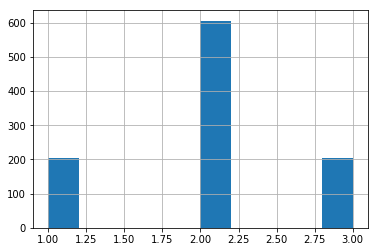

In [19]:
outcome.Class.hist()
plt.show()

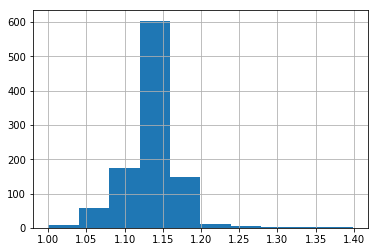

In [20]:
outcome.Score.hist()
plt.show()

In [21]:
census_utils.genchoropleth(outcome, 'Score')

Data appears to show that Scotland is generally providing the same amount of unpaid care regardless of locations. On inspecting, zooming in on the city centres again shows lower score of unpaid care. However, the low score shows that despite a good general spread of the amount of unpaid care, the amount is quite low. With the majority of the population providing no unpaid care.

In [22]:
requested1 = { 'LC3301SC': ['0005'] }
requested2 = { 'LC3301SC': ['0009'] }
requested3 = { 'LC3301SC': ['0013'] }
requested4 = { 'LC3301SC': ['0017'] }
requested5 = { 'LC3301SC': ['0021'] }

piedata1 = census_utils.extractdata(requested1)
piedata2 = census_utils.extractdata(requested2)
piedata3 = census_utils.extractdata(requested3)
piedata4 = census_utils.extractdata(requested4)
piedata5 = census_utils.extractdata(requested5)

x=905
piedatagraph1 = [piedata1.iloc[x][0],piedata2.iloc[x][0],piedata3.iloc[x][0],piedata4.iloc[x][0],piedata5.iloc[x][0]]
fruits = ['none', '1-19 hours', '20-34 hours', '35-49 hours', '50+ hours']
series = pd.Series(piedatagraph1, index=fruits, name='hours of care provided in areacode '+str(piedata1.iloc[x]))

x=507
piedatagraph2 = [piedata1.iloc[x][0],piedata2.iloc[x][0],piedata3.iloc[x][0],piedata4.iloc[x][0],piedata5.iloc[x][0]]
series2 = pd.Series(piedatagraph2, index=fruits, name='hours of care provided in areacode '+str(piedata1.iloc[x]))

x=6
piedatagraph3 = [piedata1.iloc[x][0],piedata2.iloc[x][0],piedata3.iloc[x][0],piedata4.iloc[x][0],piedata5.iloc[x][0]]
series3 = pd.Series(piedatagraph3, index=fruits, name='hours of care provided in areacode '+str(piedata1.iloc[x]))

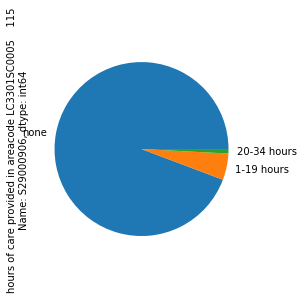

In [23]:
series.plot.pie(figsize=(8, 4))

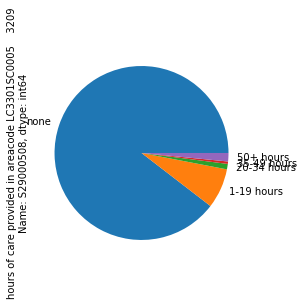

In [24]:
series2.plot.pie(figsize=(8, 4))

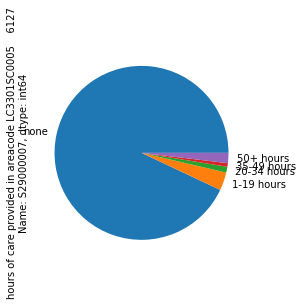

In [25]:
series3.plot.pie(figsize=(8, 4))

From analysing the breakdown of unpaid care hours in 3 random areas, it is clear that very few people provide any unpaid care at all. Roughly >75% of people provide no unpaid care. This matches the Chloropleth map and tells me that the choloropleth map is accurate and represents what I was trying to look at. I would have liked to use the map to find area codes to more deeply look into the proportion of unpaid hours to compare to factors such as, dependant children, hours worked etc to see what factors would make people more likely to provide unpaid care.

In [26]:
LC2301SCrequested1 = { 'LC2301SC': ['0033'] }
LC2301SCrequested2 = { 'LC2301SC': ['0057'] }
LC2301SCrequested3 = { 'LC2301SC': ['0081'] }
LC2301SCrequested4 = { 'LC2301SC': ['0105'] }
LC2301SCrequested5 = { 'LC2301SC': ['0129'] }
LC2301SCrequested6 = { 'LC2301SC': ['0153'] }

ethpiedata1 = census_utils.extractdata(LC2301SCrequested1)
ethpiedata2 = census_utils.extractdata(LC2301SCrequested2)
ethpiedata3 = census_utils.extractdata(LC2301SCrequested3)
ethpiedata4 = census_utils.extractdata(LC2301SCrequested4)
ethpiedata5 = census_utils.extractdata(LC2301SCrequested5)
ethpiedata6 = census_utils.extractdata(LC2301SCrequested6)

x=345
ethpiedatagraph1 = [ethpiedata1.iloc[x][0],ethpiedata2.iloc[x][0],ethpiedata3.iloc[x][0],ethpiedata4.iloc[x][0],ethpiedata5.iloc[x][0],ethpiedata6.iloc[x][0]]
fruits = ['White', 'Mixed or multiple ethnic groups', 'Asian Asian Scottish or Asian British', 'African', 'Caribbean or Black','Other ethnic groups']
series4 = pd.Series(ethpiedatagraph1, index=fruits, name='hours of care provided in areacode '+str(ethpiedata1.iloc[x]))

x=291
ethpiedatagraph2 = [ethpiedata1.iloc[x][0],ethpiedata2.iloc[x][0],ethpiedata3.iloc[x][0],ethpiedata4.iloc[x][0],ethpiedata5.iloc[x][0],ethpiedata6.iloc[x][0]]
series5 = pd.Series(ethpiedatagraph2, index=fruits, name='hours of care provided in areacode '+str(ethpiedata1.iloc[x]))

x=760
ethpiedatagraph3 = [ethpiedata1.iloc[x][0],ethpiedata2.iloc[x][0],ethpiedata3.iloc[x][0],ethpiedata4.iloc[x][0],ethpiedata5.iloc[x][0],ethpiedata6.iloc[x][0]]
series6 = pd.Series(ethpiedatagraph3, index=fruits, name='hours of care provided in areacode '+str(ethpiedata1.iloc[x]))

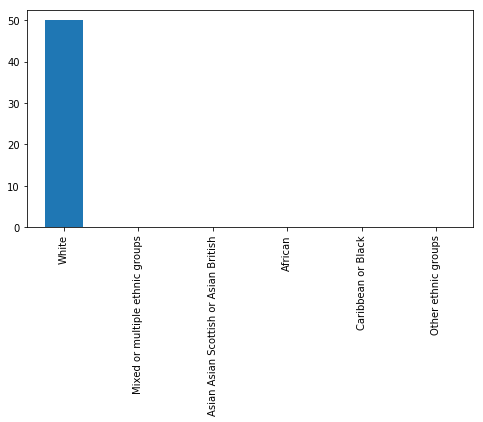

In [27]:
series4.plot.bar(figsize=(8, 4))

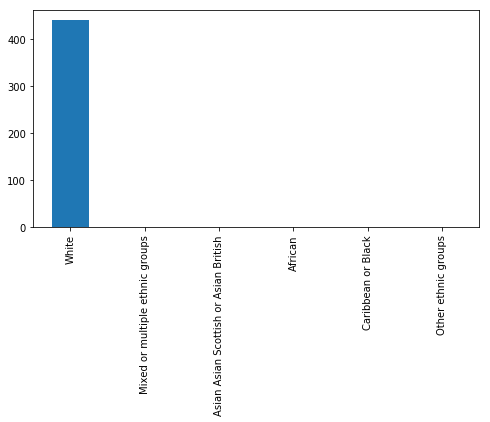

In [28]:
series5.plot.bar(figsize=(8, 4))

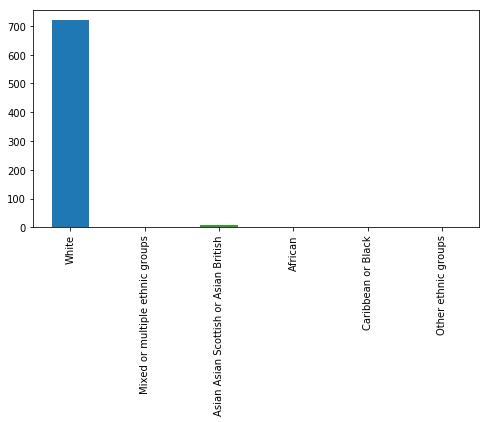

In [29]:
series6.plot.bar(figsize=(8, 4))

Looking further into the unpaid care data, it appears most care is provided by people of white ethinicity. However, this seems logical as ~91.9% of the scottish populace identified themselves as White British. This provided little insight into predicting a trend about those who provide unpaid care in Scotland.

In [30]:
LC3301SCrequested1 = { 'LC3301SC': ['0033'] }
LC3301SCrequested2 = { 'LC3301SC': ['0057'] }
LC3301SCrequested3 = { 'LC3301SC': ['0081'] }
LC3301SCrequested4 = { 'LC3301SC': ['0105'] }

agepiedata1 = census_utils.extractdata(LC2301SCrequested1)
agepiedata2 = census_utils.extractdata(LC2301SCrequested2)
agepiedata3 = census_utils.extractdata(LC2301SCrequested3)
agepiedata4 = census_utils.extractdata(LC2301SCrequested4)


x=687
agepiedatagraph1 = [agepiedata1.iloc[x][0],agepiedata2.iloc[x][0],agepiedata3.iloc[x][0],agepiedata4.iloc[x][0]]
fruits = ['0 to 24', '25 to 49', '50 to 64','65 and over']
series7 = pd.Series(agepiedatagraph1, index=fruits, name='hours of care provided in areacode '+str(agepiedata1.iloc[x]))

x=307
agepiedatagraph2 = [agepiedata1.iloc[x][0],agepiedata2.iloc[x][0],agepiedata3.iloc[x][0],agepiedata4.iloc[x][0]]
series8 = pd.Series(agepiedatagraph2, index=fruits, name='hours of care provided in areacode '+str(agepiedata1.iloc[x]))

x=902
agepiedatagraph3 = [agepiedata1.iloc[x][0],agepiedata2.iloc[x][0],agepiedata3.iloc[x][0],agepiedata4.iloc[x][0]]
series9 = pd.Series(agepiedatagraph3, index=fruits, name='hours of care provided in areacode '+str(agepiedata1.iloc[x]))

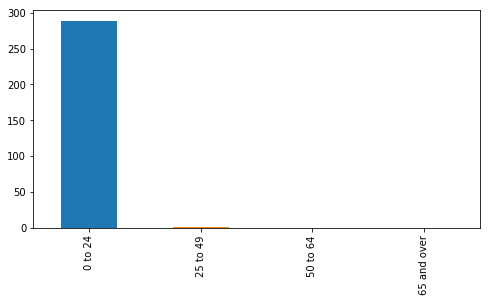

In [31]:
series7.plot.bar(figsize=(8, 4))

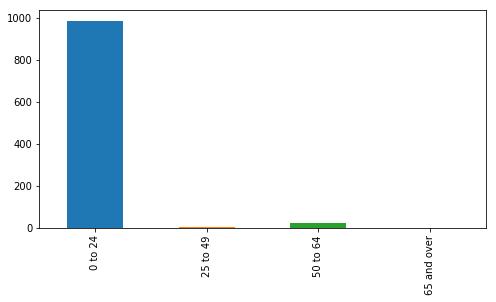

In [32]:
series8.plot.bar(figsize=(8, 4))

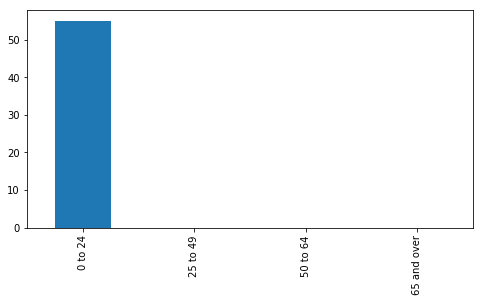

In [33]:
series9.plot.bar(figsize=(8, 4))

Looking into age - similarly to ethinicity - care is mostly provided by one group. The bracket 0-24 provides the large majority of unpaid care. Whether or not this is due to nurse training, volunteering or other methods is unclear. But an interesting effect. These graphs look into people in all households providing between 0-19 hours of care a week and helped me realise this would make it very difficult to predict any features as the data is all heavily skewed.

# Machine learning

Given that the previous data is all heavily skewed in a single group, it would be practically useless for a study. So i decided to use the 'Economic activity by living arrangements' from the choloropleth maps from the first section.

I will try to look at what kind of living arrangements people have, depending on their occupations. Listed below are the 4 options to look at and hopefully the machine learning will be able to predict the type pay a household will be earning.

LC4427SC0003 - All households_Owned: Owned outright  
LC4427SC0004 - All households_Owned: Owned with a mortgage or loan or shared ownership
LC4427SC0006 - All households_Rented or living rent free: Social rented
LC4427SC0007 - All households_Rented or living rent free: Private rented or living rent free

Weighted with:  
LC4427SC0002 - All households_Owned: Total  
LC4427SC0005 - All households_Rented or living rent free: Total  

(300, 4) (300, 1)


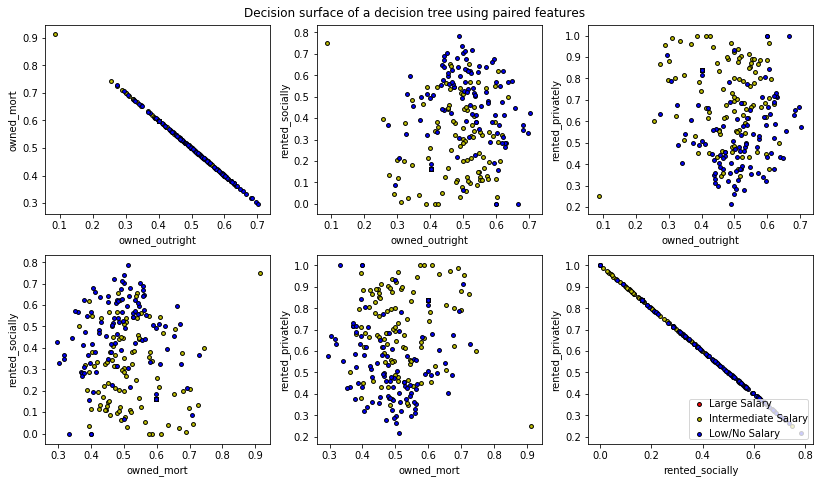

In [34]:
owned_outright = { 'LC4427SC': ['0003'] }
norm_owned_outright = {'LC4427SC' : { '0003':'0002' }}
                 
owned_mort = { 'LC4427SC': ['0004'] }
norm_mort = {'LC4427SC' : { '0004':'0002' }}
                 
rented_soc = { 'LC4427SC': ['0006'] }
norm_soc = {'LC4427SC' : { '0006':'0005' }}                 

rented_pri = { 'LC4427SC': ['0007'] }
norm_pri = {'LC4427SC' : { '0007':'0005'  }}

owned1 = census_utils.extractdata(owned_outright, norm_owned_outright)
owned2 = census_utils.extractdata(owned_mort, norm_mort)
rent1 = census_utils.extractdata(rented_soc, norm_soc)
rent2 = census_utils.extractdata(rented_pri, norm_pri)

requested_jobs = { 'LC6605SC': ['0008', '0015', '0022', '0029','0036','0043','0050','0057','0064'] }

weights_jobs = {   'LC6605SC0008' : 1, 
                   'LC6605SC0015' : 2,
                   'LC6605SC0022' : 3,
                   'LC6605SC0029' : 4,
                   'LC6605SC0036' : 5,
                   'LC6605SC0043' : 6,
                   'LC6605SC0050' : 7,
                   'LC6605SC0057' : 8,
                   'LC6605SC0064' : 9   }

mltiers = [0.2, 0.8]
outcome = census_utils.genclfscore(requested_jobs, weights_jobs, mltiers)

target = outcome[['Class']]

householdtype = [owned1,owned2,rent1,rent2]
newfeatures = pd.concat(householdtype, axis=1)
newfeatures.columns = ['owned_outright','owned_mort','rented_socially','rented_privately']

newlookup = pd.concat([newfeatures,target], axis=1)

dataframe  = pd.concat([newlookup[newlookup.Class == 1].head(100),newlookup[newlookup.Class == 2].head(100),newlookup[newlookup.Class == 3].head(100)])

features = dataframe[['owned_outright','owned_mort','rented_socially','rented_privately']]
newtarget = dataframe[['Class']]

datanames = ['owned_outright','owned_mort','rented_socially','rented_privately']
targetnames = ['Large Salary','Intermediate Salary','Low/No Salary']

data = features.values
target = newtarget

print(data.shape, target.shape)
dt_utils.featureplot(data, target, 3, t_names=('owned_outright','owned_mort','rented_socially','rented_privately'), c_names=('Large Salary','Intermediate Salary','Low/No Salary'))

Immediately from looking at the data, it is apparent that there are very little people - or perhaps its just hard to see - anyone earning in the top 20 percentile. The majority of data points are for the either the low/no salary subsection or intermediate salary section.

Also, from the rented vs rented and owned vs owned data, it shows the data is input correctly as the more socially rented out of total rented homes there are, the less privately rented homes there will be. A perfectly linear correlation. However there appears to be no trend that would imply what kind of home any particular type of salary would own.

However, there does appear to be more socially rented homes in a lot of areas in scotland compared to owned houses.

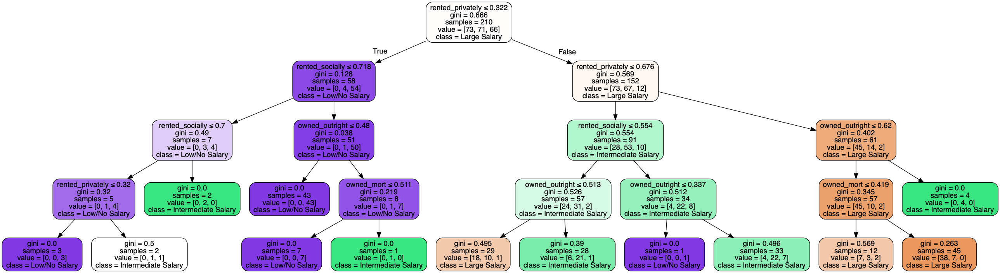

In [35]:
train_data, test_data, train_target, test_target = model_selection.train_test_split(
    data, target, test_size=0.3, random_state=0)

clf = tree.DecisionTreeClassifier(max_depth=4)
fit = clf.fit(train_data, train_target)
expected = test_target
predicted = clf.predict(test_data)

graph = dt_utils.plotDT(fit, datanames, targetnames)
Image(graph.create_png())

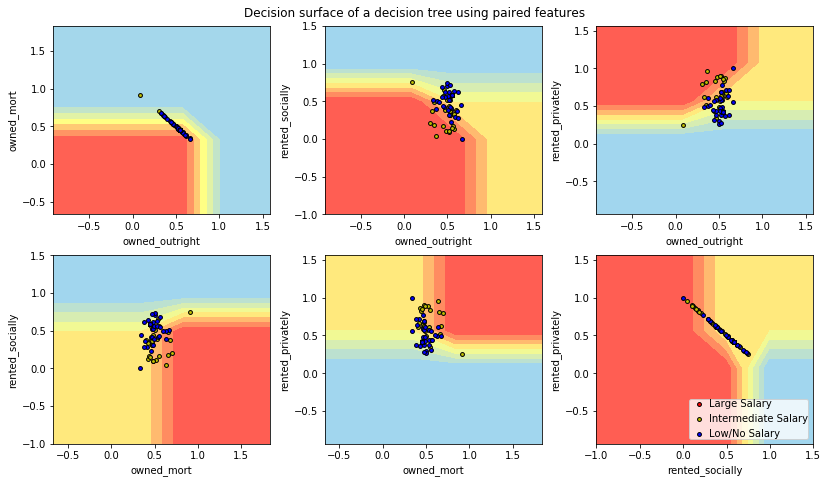

In [36]:
dt_utils.featureplot(train_data, train_target, 3, plt_step=0.5,
            clf=clf, 
            d_test=test_data,
            t_test=test_target,
            t_names=['owned_outright','owned_mort','rented_socially','rented_privately'], 
            c_names=targetnames)
plt.show()

The data set appears to have little to no information on the larger salary percentiles I have defined. Perhaps changing from a [0.2,0.8] split I could try making the groups more evenly quantised?

The graphs seem to show that more homes are rented socially and privately than owned. It is easier to see from these images than the previous.

              precision    recall  f1-score   support

           1       0.52      0.59      0.55        27
           2       0.44      0.48      0.46        29
           3       0.85      0.68      0.75        34

   micro avg       0.59      0.59      0.59        90
   macro avg       0.60      0.58      0.59        90
weighted avg       0.62      0.59      0.60        90



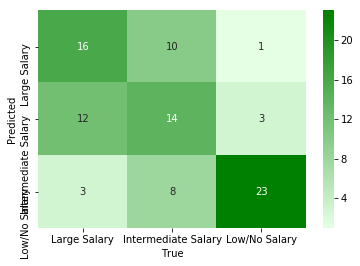

In [37]:
report = metrics.classification_report(expected, predicted)
print(report)

cm = metrics.confusion_matrix(expected, predicted)

dt_utils.heatmap(cm, labels=['True', 'Predicted'], 
        classes=[targetnames,targetnames],
        normalize=False)

The confusion matrix shows that the machine learning technique is generally able to correctly identify the pay bracket with the data it is given, however, it does seem to have inconsistencies around the intermediate salary. For example, the machine rarely guesses low/no salary when the actual value is large salary and vice versa. The machine does guess incorrectly a lot more often where deviations between salary groups is only one.

/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'max_depth': 4, 'max_leaf_nodes': 5}


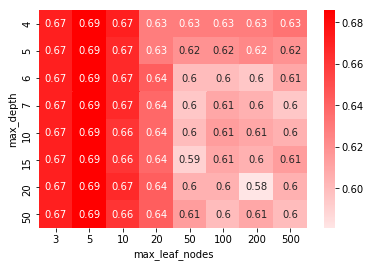

In [38]:
params = {'max_leaf_nodes' : [3, 5, 10, 20, 50, 100, 200, 500], 
          'max_depth' : [4, 5, 6, 7, 10, 15, 20, 50]
         }
score = 'accuracy'
clf = model_selection.GridSearchCV(tree.DecisionTreeClassifier(), params, cv=5, scoring='%s' % score)
clf.fit(train_data, train_target)

print(clf.best_params_)
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']

# show heatmap
labels = [k for k,v in params.items()]
classes = [v for k,v in params.items()]
dt_utils.heatmap(means.reshape(8,8), classes=classes, labels=labels, palette="Red")

In [39]:
train_data, test_data, train_target, test_target= model_selection.train_test_split(data, target, test_size=0.3, random_state=0)
clf = tree.DecisionTreeClassifier(max_depth=4, max_leaf_nodes=100)
fit = clf.fit(train_data, train_target)
expected = test_target
predicted = clf.predict(test_data)
report = metrics.classification_report(expected, predicted)
print(report)

              precision    recall  f1-score   support

           1       0.58      0.52      0.55        27
           2       0.47      0.62      0.54        29
           3       0.82      0.68      0.74        34

   micro avg       0.61      0.61      0.61        90
   macro avg       0.63      0.61      0.61        90
weighted avg       0.64      0.61      0.62        90



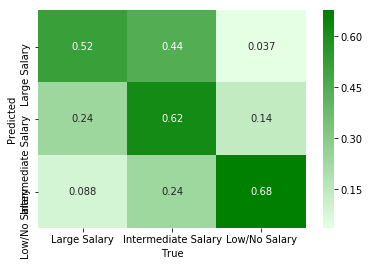

In [40]:
cm = metrics.confusion_matrix(expected, predicted)
dt_utils.heatmap(cm, labels=['True', 'Predicted'], 
        classes=[targetnames,targetnames],
        normalize=True)

Even after using a grid search to find good parameters to hopefully make the machine learning more accurate. The machine learning approach still gives a variation within one salary group range, but again still rare guessing the two opposite salary groups.

# Conclusion

### Data Exploration and Extraction

Navigating the dataset was cumbersome and annoying, but easy enough to find general features of interest using commands to essentially search for keywords. The difficulty with some UniqueCatCodes, where DC and dz coded features wouldn't load in properly made my topic more difficult to investigate. 

Generally, manipulating the dataset once constrained was easy and the data mostly loaded into processes I wanted. 

### Interpretation and Visualisation

This was by far the most fun part of the project. I aimed to look at levels of unpaid care across the country and was suprised by my findings. I expected to see that generally most groups would provide some unpaid care (perhaps, young mothers, parents with dependant children, elderly couples looking after an indisposed other etc). The data actually showed that in most cases, unpaid care was provided by White British young adults (0-24). The amount of care provided by other ethincities and ages was almost negligible. I would have liked to explore unpaid care by sex but unfortunately that subset of the dataset wouldn't load into the census_utils correctly; I also couldn't figure out how to load it in myself with the same format so that it wouldn't break the rest of the data. 
  
Unfortunately, this trend meant that the machine learning wouldn't have much to work on. With 92% of the population in Scotland being White British, perhaps choosing another feature from the start would have been easier.   

If I were to continue this study, given what I found already. I would like to look into unpaid care by sex, to see which gender provides more unpaid care, then perhaps a more specific delve into occupations. Perhaps the age group 0-24 provides more care due to student nurses gaining work experience? Or perhaps the study would show that most of that group were teenage mothers (if I limit the group of unpaid care to the age group and add in the data about dependant children), suggesting that maybe a government drive on sexual education would be necessary (as a possible use for the data from the study).

Furthermore, I would like to see how the average age in postcodes, and unpaid/paid care provided overlayed to maybe see if some areas were struggling to provide care for the elderly or more vulnerable. However that would require data on paid care that I don't think the dataset provides. This could be used in the health sector for maximising accessiblilty to the NHS via placement of practices in specific areas that are struggling. Alternatively, if the NHS provided information about the types of unpaid care provided or surveyed households where unpaid care is provided, an indication into the type of care provided by nurses compared to family members could also be invesigated and perhaps lead to budget adjustments within the NHS.

### Machine learning prediction

As mentioned before, the unpaid care data wouldn't really showcase a machine learning approaches power.   

I decided to try to compare the type of household economically active occupiers to the type of job they hold and correlate that with self-imposed pay bands. Essentially Low, Medium and High. The trends implied that lower salaries tended to occupy social rented households and privately rented households, whilst the larger salaried bands occupied privately rented, owned but mortgaged and fully owned properties. This follows logic and I was hoping the results would match my prediction. The difficulty I found, was, with finding a good amount of data to use for testing and predicting. The more data I added, the rarer that the low/no salary and large salary datapoints became and the machine became a lot more accurate at predicting intermediate pay bands and worse at predicted the outliers. When the machine was fed smaller amounts of data where all the pay bands would have proportional amounts of datapoints, the machine generally predicted the two outlier bands a lot more accurately.

Using the confusion matrix to compare the process before and after using the heatmap to grid search for the best parameters also helped show improvement. There were only a few variables however so the model could really use more features than improving the parameters.

I would have liked to go further to maybe look at the ages and sexes of people who owned/rented said homes to see if there was any trend between sex and home ownership or age and type of home.

### Conclusions

Interestingly, I found that unpaid care was not provided more than roughly 80% of the time. Also, that a much larger percentage of the care that was provided was provided by White British people. However, this makes sense given the proportion of Scotlands general populace in regards to ethnicity which I had not thought about before picking this feature. What did surprise me was that generally, unpaid care was provided by the 0-24 age band. I had expected a lot more unpaid care from older age groups with perhaps spouses to look after or children to care for. Without another census to compare the data to, I have no idea how accurate of precise it is, only that the methods I used with the data did what I expected. 

The machine learning technique predicted the trend that I expected which was that the lower pay bands tended to rent homes whereas the higher paid bands tended to own or privately rent. The parameter grid-search also helped improve the parameters I used to refine the results.